# BE 2 : unsupervised machine learning for imaging
### Focus on hyperspectral imaging

In this lab, we will apply some techniques of unsupervised machine learning for image processing/computer vision. We first consider an already pre-processed hyperspectral AVIRIS image. We will try to apply clustering algorithms and factor analysis techniques to this images, in order to get the spectra of elements (grass, soil, water, etc), and their spatial repartition in the image.

## 1. Read and visualize the hyperspectral image

First load some modules

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import scipy.io as sio
from sklearn.cluster import KMeans
from numpy import linalg as LA
from sklearn.decomposition import NMF

In [2]:
matplotlib.rcParams['figure.figsize'] = (14, 8)

Now download the AVIRIS image. Be careful it has not been compressed to it is more than 300 Mo big.

In [3]:
!curl https://nextcloud.isae.fr/index.php/s/GtXPpJ8xiDSrFFo/download -O # Adapt if your OS is not a Linux
!ls

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  358M  100  358M    0     0  7266k      0  0:00:50  0:00:50 --:--:-- 5758k
Lab2_unsupervised.ipynb download
barbara.pgm             tulip.ppm


In [4]:
!mv download aviris.mat

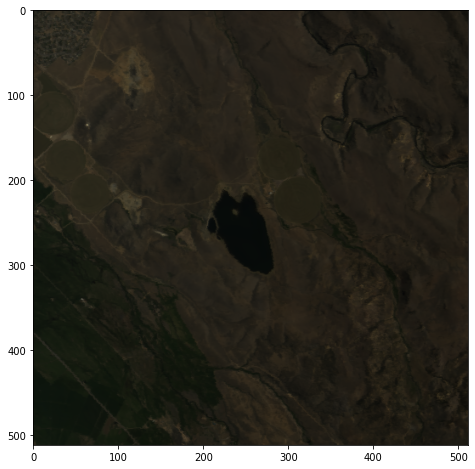

In [3]:
# Load test data
aviris = sio.loadmat('aviris.mat')
img = aviris['aviris']

# RGB bands to display
bands = (26, 20, 11)

# Display image
plt.imshow(img[:,:,bands])
plt.show()

We can observe that the contrast on the image is very poor. Yet the image dynamics is (0,1), this is not a problem of normalization or type. Actually, and this is often the case with satellite images, some pixels in some bands have saturated, so their values is very high, which lowers the constrast of the rest of the image. 
We will thus make a nonlinear scaling, by simply clipping the lower and top 1% of values.

(array([1., 0., 1., ..., 0., 0., 2.]),
 array([1.10885436e-07, 7.29505488e-04, 1.45890009e-03, ...,
        9.98541322e-01, 9.99270716e-01, 1.00000011e+00]),
 <BarContainer object of 1371 artists>)

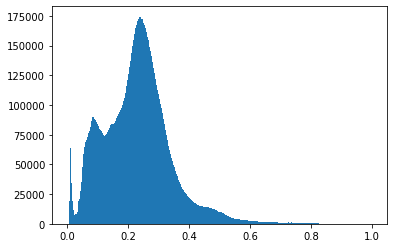

In [6]:
#Display histogram
plt.hist(img.flatten(), bins='auto')

In [7]:
def normalize_img(img):
    res = img;
    for k in np.arange(3):
        vmin = np.percentile(res[:,:,k],1)
        vmax = np.percentile(res[:,:,k],99)
        res[:,:,k] = (res[:,:,k] - vmin) / (vmax - vmin)
        np.clip(res[:,:,k], 0., 1., res[:,:,k]) # in-place clipping
    return res

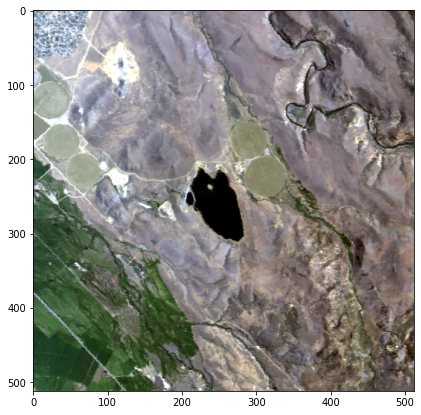

In [14]:
# Normalize and increase contrast, then display
plt.figure(figsize=(7,7))
plt.imshow(normalize_img(img[:,:,bands]))
plt.show()

Do not forget this is a hyperspectral image, where each pixel is a spectrum made of many spectral bands. Let us plot some random spectra of this image.

In [15]:
img.shape

(512, 512, 191)

In [24]:
def plot_spectra(img, idx):
    s = img.shape
    img = img.reshape(s[0]*s[1], s[2])
    plt.plot(np.transpose(img[idx,:]))
    plt.legend(idx)
    plt.show()
    return

In [25]:
idx_spectra

array([304, 489,  66,  81,  76, 243, 469, 256, 490, 404, 224, 284, 312,
        54, 105, 323,  43, 321,   1, 211])

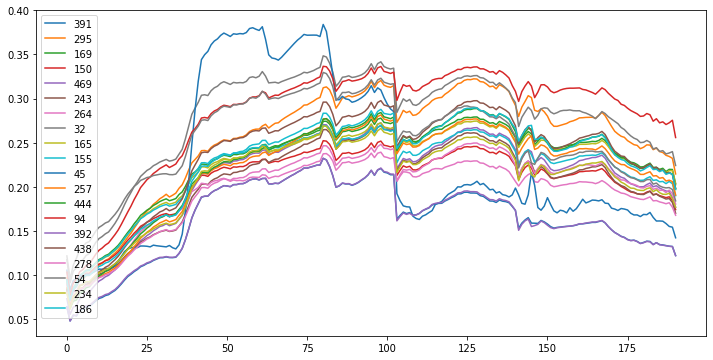

In [26]:
#Get 20 random pixels
idx_spectra = np.random.randint(low=0, high=np.prod(img.shape[0:1]), size=20)

#Display the corresponding spectra
plt.figure(figsize=(12,6))
plot_spectra(img,idx_spectra)

## 2. K-means segmentation

Let us apply a well-known clustering algorithm to the pixels of the image.

In [35]:
img2.shape

(262144, 191)

In [49]:
# Reshape image into 2 dimensions : space x spectrum
s = img.shape
img2 = img.reshape(s[0]*s[1], s[2])

# Apply K-means
km = KMeans(n_clusters=4)
km.fit(img2)

KMeans(n_clusters=4)

We can now visualize the segmentation: the centers will be the spectra of the different elements, and the labels with give the spatial repartition of those elements in the image.

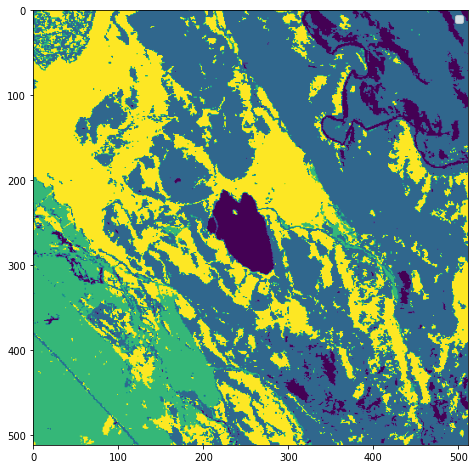

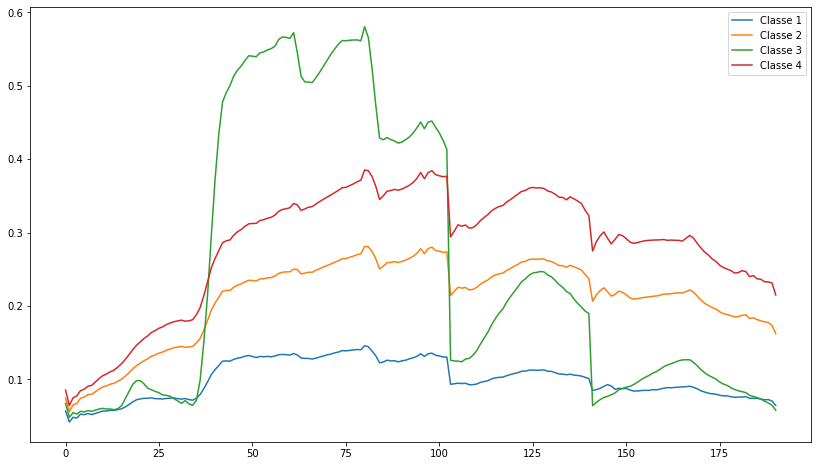

In [50]:
# Display segmentation result
img_km = km.labels_
plt.imshow(img_km.reshape(s[0], s[1]))
plt.gca().legend(('Classe 1','Classe 2','Classe 3','Classe 4'))
plt.show()

# Display centroids
centers = km.cluster_centers_.transpose()
plt.plot(centers)
plt.gca().legend(('Classe 1','Classe 2','Classe 3','Classe 4'))
plt.show()


### Get the best K
It seems in the previous example that soil, vegetation and water have been correctly identified. But we might obtain better results with a smaller or a larger number of classes. 

<b> Exercise</b>
- Make K varry and observe the results
- Compute the K-means loss function (intra-class variance) as a function of K, and estimate the inflexion point (Elbow method)


In [38]:
from tqdm.autonotebook import trange, tqdm
# Your turn
def kmeans(K, data=img2):
    # Apply K-means
    km = KMeans(n_clusters=K)
    km.fit(data)
    return km.inertia_, km

scores = []
models = []
for K in tqdm(np.arange(1,11)):
    s, km = kmeans(K)
    scores.append(s)
    models.append(km)

100%|██████████| 20/20 [09:24<00:00, 28.21s/it]


Text(0, 0.5, 'KMeans inertia_')

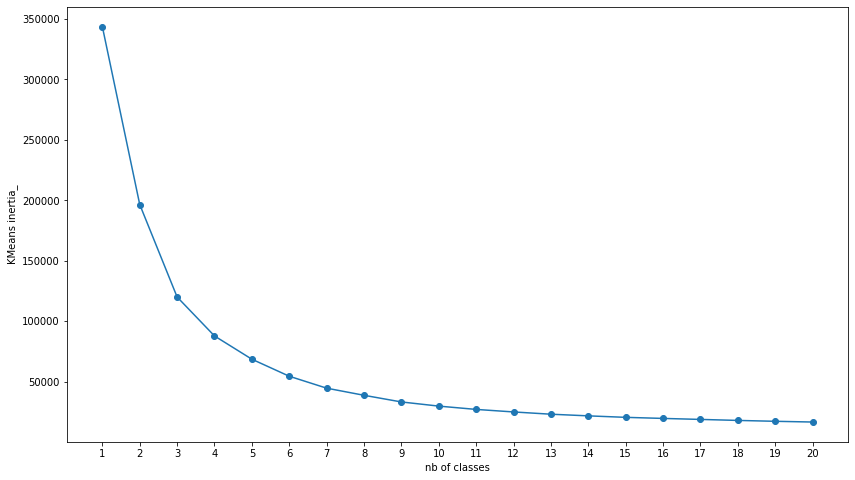

In [46]:
plt.plot(np.arange(1,21), scores)
plt.scatter(np.arange(1,21), scores)
plt.xlabel("nb of classes")
plt.xticks(np.arange(1,21))
plt.ylabel("KMeans inertia_")

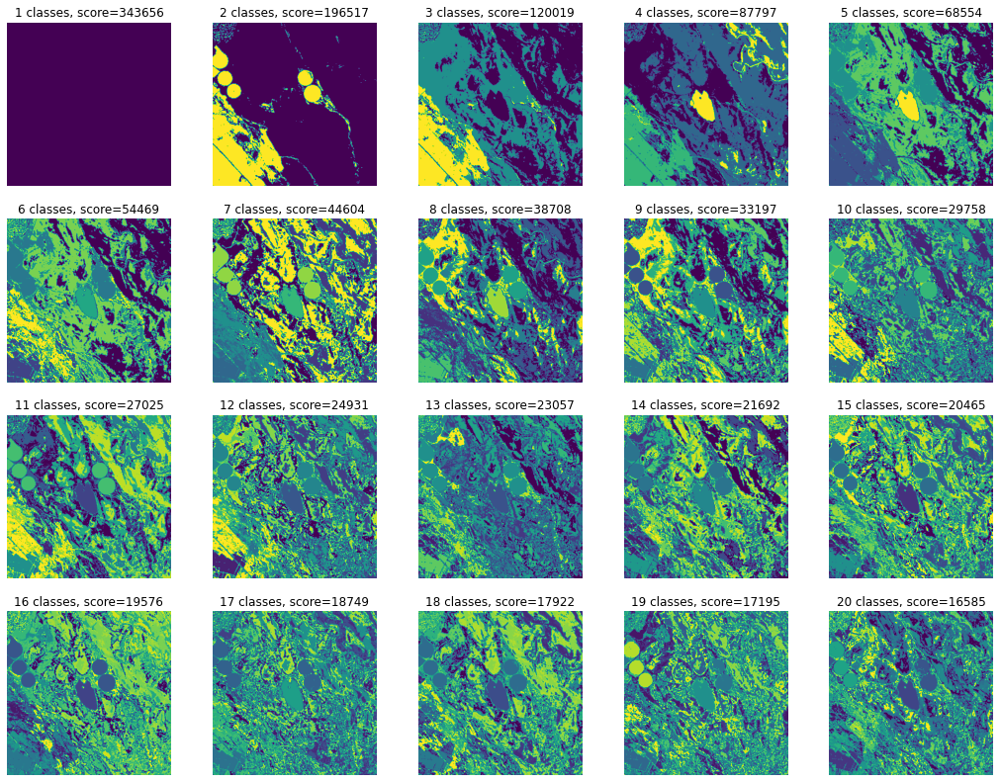

In [66]:
s = img.shape
fig, axes = plt.subplots(4,5, figsize=(18,14))
axes = axes.flatten()
for i, km in enumerate(models):
    # Display segmentation result
    img_km = km.labels_
    axes[i].imshow(img_km.reshape(s[0], s[1]))
    axes[i].axis("off")
    axes[i].set_title(f"{i+1} classes, score={km.inertia_:.0f}")
plt.show()

## 3. Dimension reduction with PCA
We will apply a principal component analysis in the pixel's space. Remember, PCA is a core technique in ML, it brings:
- Dimension reduction
- Denoising
- Decorrelation
- Variable selection
- Easy visualization
- etc

We will implement our own PCA but of course we could use sklearn as well.

<ipython-input-67-9a876af5e7de>:16: RuntimeWarning: invalid value encountered in log
  plt.plot(np.log(lambdas))


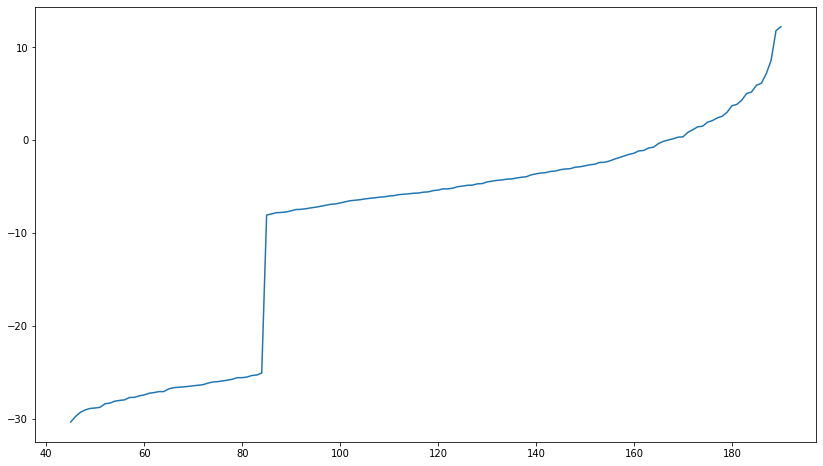

(191,)


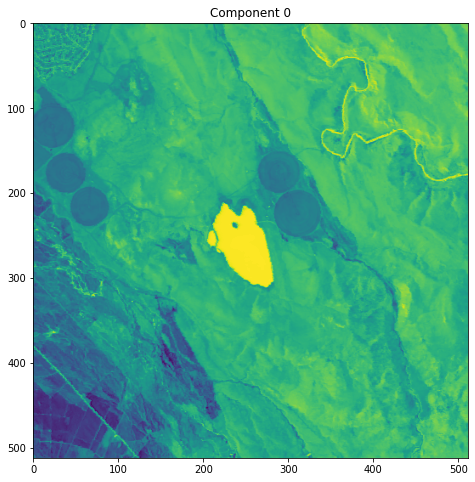

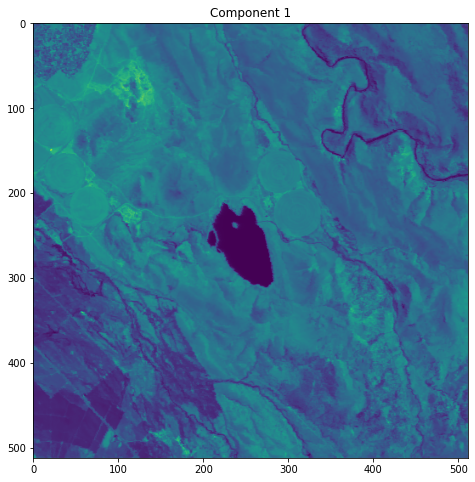

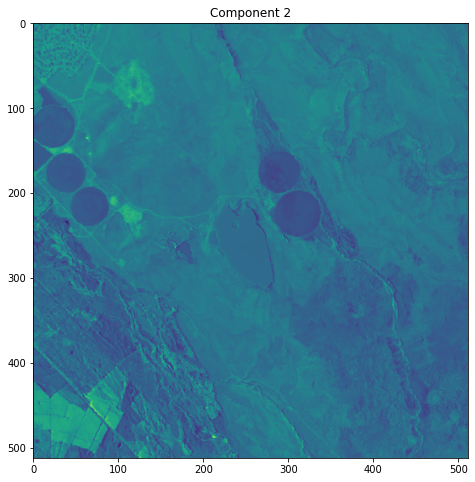

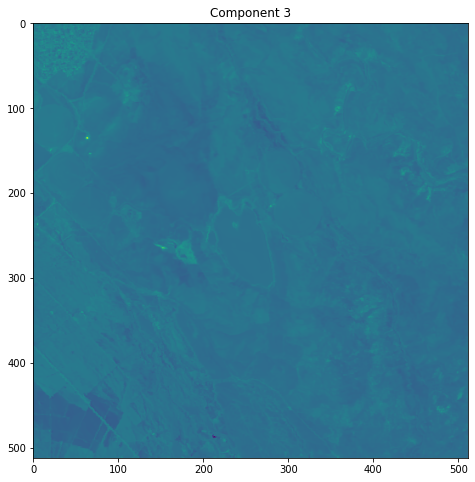

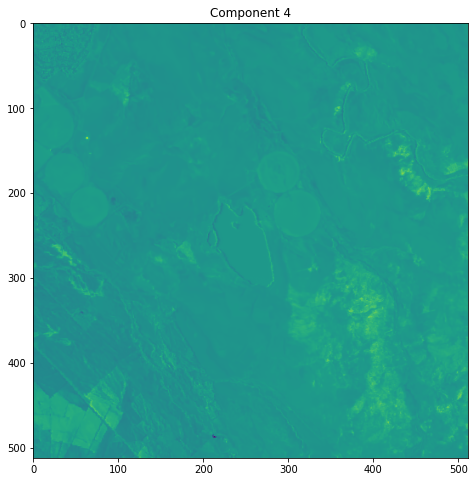

...

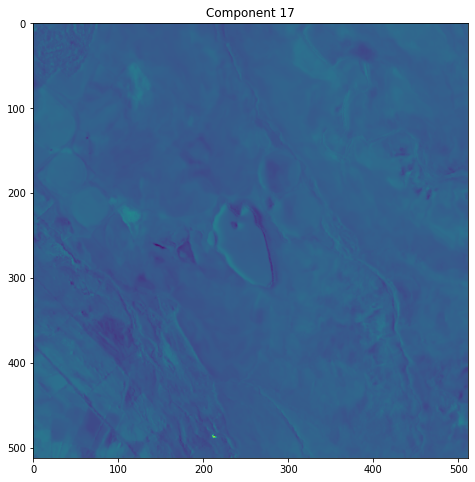

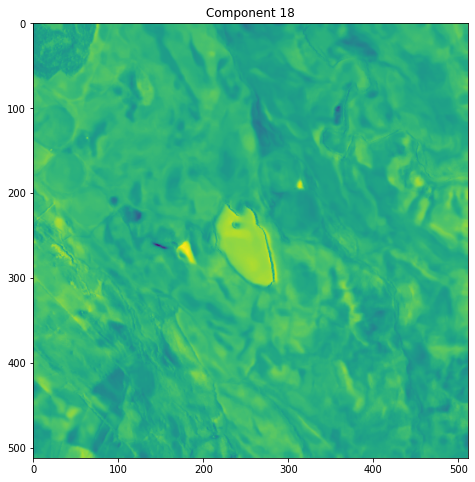

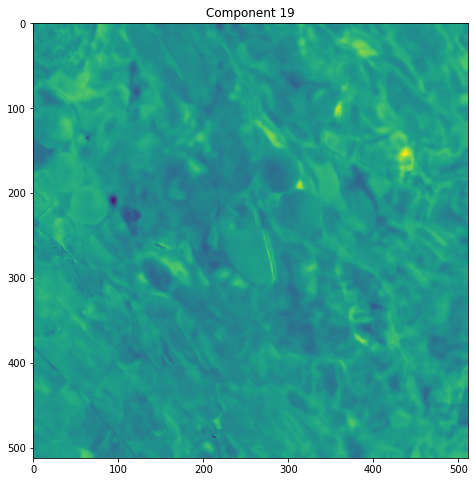

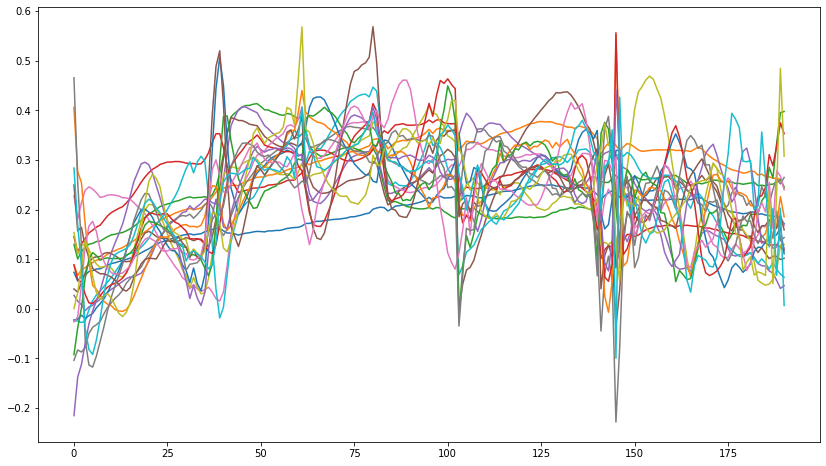

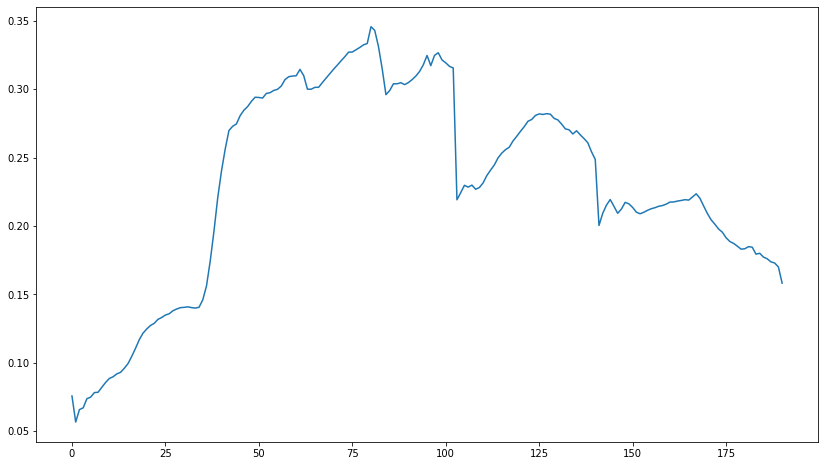

In [67]:
# Load test data
aviris = sio.loadmat('aviris.mat')
img = aviris['aviris']
s = img.shape
img2 = img.reshape(s[0]*s[1], s[2])

# Compute sample covariance matrix
mu = np.mean(img2, axis=0)
img2 -= mu
cov = np.matmul(np.transpose(img2), img2)

# Get eigen values and vectors
lambdas, U = LA.eigh(cov)

# Plot eigenvalues
plt.plot(np.log(lambdas))
plt.show()

# Map image to the first 20 components
U = U[:,-1:-21:-1]
y = np.matmul(img2,U)
y = np.reshape(y, [s[0], s[1], 20])
print(mu.shape)

# Display corresponding images
for k in range(20):
    plt.imshow(y[:,:,k])
    plt.title('Component {}'.format(k))
    plt.show()
    
# Display the spectra
plt.plot(np.transpose(mu+np.transpose(U)))
plt.show()
plt.plot(mu)
plt.show()

### Exercise
Get the approximation of the data when projecting back in the original image space, and compute the MSE.

In [44]:
# TODO
def eigh_on_img(img: np.array):
    s = img.shape
    img_flat = img.reshape(s[0]*s[1], s[2])
    # Compute sample covariance matrix
    mu = np.mean(img_flat, axis=0)
    img_flat -= mu
    cov = np.matmul(np.transpose(img_flat), img_flat)

    # Get eigen values and vectors
    lambdas, U = LA.eigh(cov)
    return lambdas, U

def plot_eig_values(img: np.array):
    lambdas, U = eigh_on_img(img)
    # Plot eigenvalues
    plt.plot(np.log(lambdas))
    plt.show()

<ipython-input-44-ac0b7a5fadd3>:17: RuntimeWarning: invalid value encountered in log
  plt.plot(np.log(lambdas))


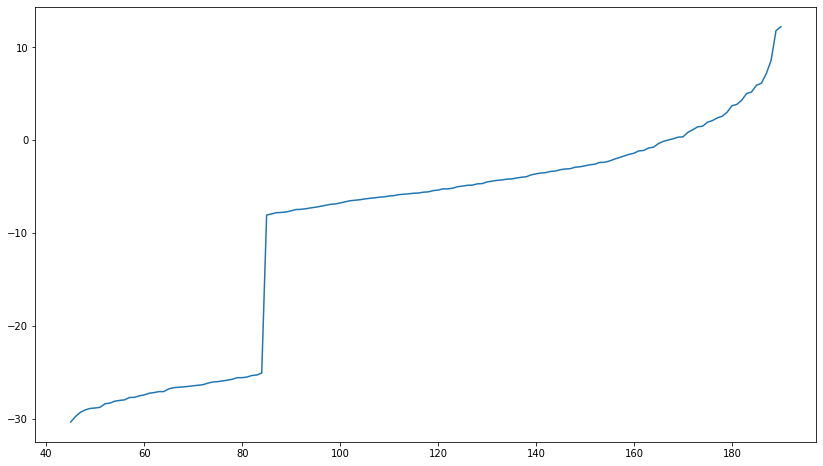

In [45]:
aviris = sio.loadmat('aviris.mat')
img = aviris['aviris']
plot_eig_values(img)

## 4. Soft clustering with nonnegative matrix factorization

We will try here to "unmix" the components of the hyperspectral image. Indeed, in practice the spatial resolution of AVIRIS is low, so most of the pixels do not contain pure components, but an approximately linear mixing of them. With NMF, we will try to identify both the element's spectra and their spatial repartition.

<b>Exercise</b>: 
- Apply NMF to the image
- Display the spectra and the coefficients (maps)
- Compare with the clustering results
- Compare with the PCA results

In [76]:
aviris = sio.loadmat('aviris.mat')
img = aviris['aviris']
# Reshape image into 2 dimensions : space x spectrum
s = img.shape
img2 = img.reshape(s[0]*s[1], s[2])
print(img.shape, img2.shape)


(512, 512, 191) (262144, 191)


In [79]:
# TODO
K = 5
nmf = NMF(n_components=K, init='random', random_state=0)
W = nmf.fit_transform(img2)
H = nmf.components_
W.shape, H.shape

/usr/local/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1076: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


((262144, 5), (5, 191))

In [83]:
nmf.reconstruction_err_

33.58214922061044

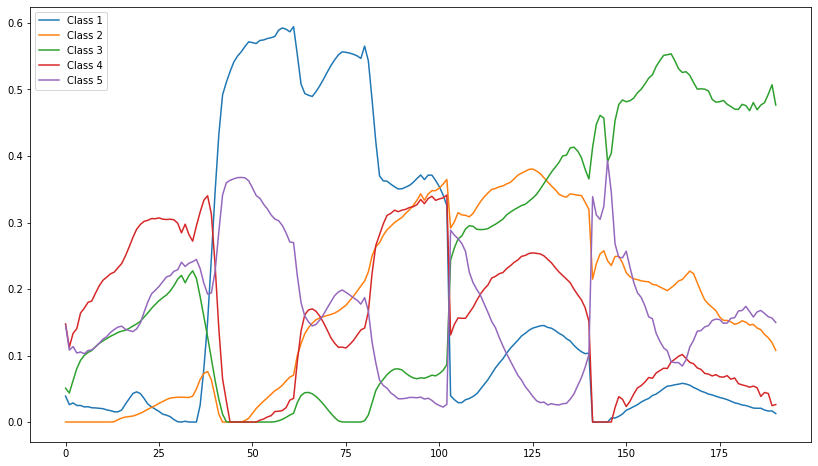

In [85]:
plt.plot(H.T)
plt.legend([f"Class {i+1}" for i in range(K)])

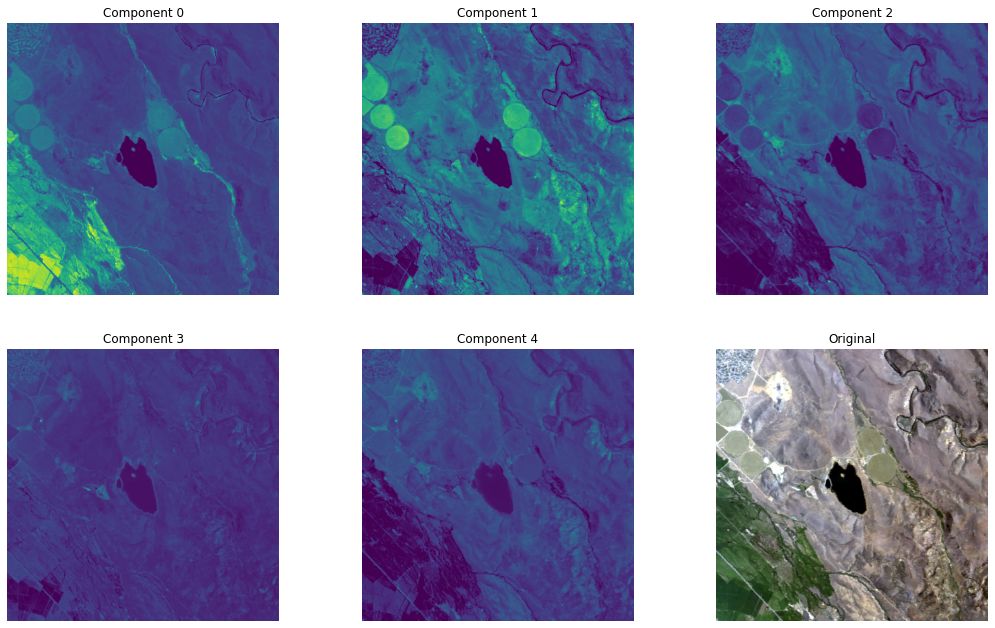

In [108]:
K = nb_classes
y = np.reshape(W, [s[0], s[1], K])
fig , axes = plt.subplots(2,3,figsize=(18,11))
axes = axes.flatten()
for k in range(K):
    axes[k].imshow(y[:,:,k])
    axes[k].set_title(f"Component {k}")
    axes[k].axis("off")
axes[5].imshow(normalize_img(img[:,:,bands]))
axes[5].axis("off")
axes[5].set_title(f"Original")
plt.show()

In [120]:
img_rec = np.zeros(img2.shape)
for i, w in enumerate(W):
    img_rec[i] = np.argmax(w)

In [116]:
img2.min(), img2.max()

(1.1088543628164359e-07, 1.0000001108854364)

In [122]:
img_rec.min(), img_rec.max()

(0.0, 4.0)

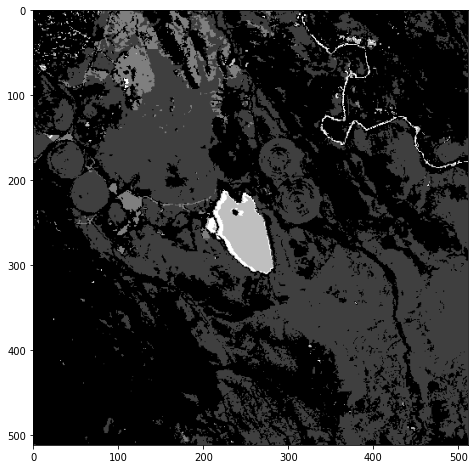

In [126]:
img_nmf = img_rec.reshape(512,512,191)
plt.imshow(img_nmf[:,:,bands]/4)

## 5. Applications on standard RGB images
We will now explore more traditional applications of unsupervised ML to imagery. Load the given tulip image.

### Clustering for vector quantization
The goal here is to lower the bit depth. Originally each pixel of the image is coded on 24 bits, we will target 8 bits, which can be useful for compression or display.

<b>Exercise</b>
- Apply a clustering to the pixels, to find the most appropriate vector quantization
- Compare with a uniform quantization

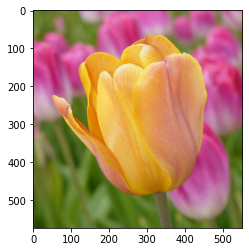

In [3]:
# TODO
import imageio
img = imageio.imread( 'tulip.ppm' )
plt.imshow(img)

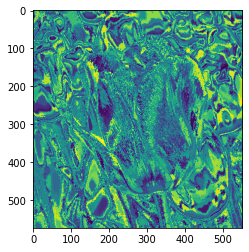

In [13]:
# Reshape image into 2 dimensions : space x spectrum
s = img.shape
img2 = img.reshape(s[0]*s[1], s[2])

nbits = 8
# Apply K-means
km = KMeans(n_clusters=2**nbits, verbose=1)
km.fit(img2)

img_km = km.labels_
plt.imshow(img_km.reshape(s[0], s[1]))

In [12]:
256**3, 2**24, 2**8

(16777216, 16777216, 256)

### Patch-based image processing
Factor analysis or dimension reduction is not directly possible on RGB images, since the pixels live in a 3-dimensional space. But we can do a lot by working in the patch space instead of the pixel space. The following code transforms learns a dictionary from a noisy grayscale image, which is a powerful method for denoising.

In [4]:
from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.feature_extraction.image import extract_patches_2d
from sklearn.feature_extraction.image import reconstruct_from_patches_2d

In [39]:
# Get the image and the patches
img = plt.imread('barbara.pgm')

# Creates a noisy version
noisy = img + np.random.normal(0,10,img.shape)
height, width = img.shape

patch_size = (7, 7)
data = extract_patches_2d(noisy, patch_size)
data = data.reshape(data.shape[0], -1)
dmean = np.mean(data, axis=0)
data -= dmean
dstd = np.std(data, axis=0)
data /= dstd

/usr/local/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_least_angle.py:570: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=3.451e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
  warnings.warn('Regressors in active set degenerate. '


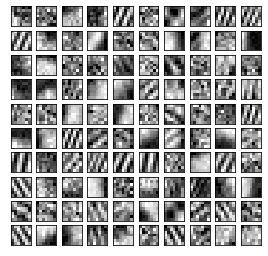

In [8]:
# Learn and displays the dictionary
dico = MiniBatchDictionaryLearning(n_components=100, alpha=1, n_iter=500)
V = dico.fit(data).components_

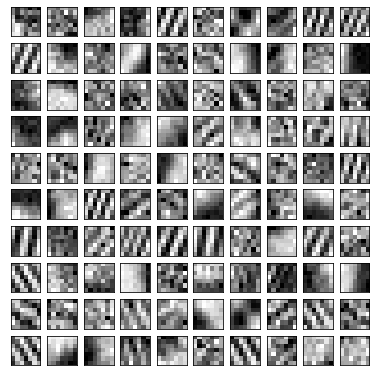

In [13]:
plt.figure(figsize=(6, 6))
for i, comp in enumerate(V[:100]):
    plt.subplot(10, 10, i + 1)
    plt.imshow(comp.reshape(patch_size), cmap=plt.cm.gray_r,
               interpolation='nearest')
    plt.xticks(())
    plt.yticks(())
plt.subplots_adjust(0.08, 0.02, 0.92, 0.85, 0.08, 0.23)

In [9]:
# Reconstruct the image

# Get the code (coefficients in each of the atoms)
code = dico.transform(data)
patches = np.dot(code, V)

# De-patchify
patches += dmean
patches = patches.reshape(len(data), *patch_size)
reconstruction = reconstruct_from_patches_2d(patches, (height, width))

Text(0.5, 1.0, 'Denoised image')

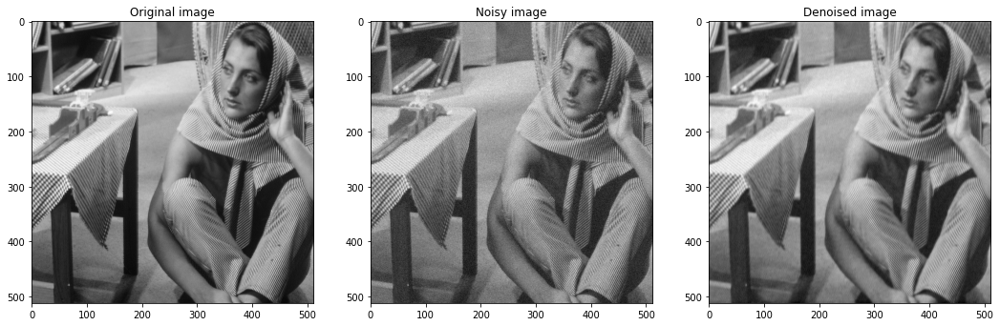

In [12]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18,6))
axes[0].imshow(img, cmap=plt.get_cmap('gray'))
axes[0].set_title('Original image')
axes[1].imshow(noisy, cmap=plt.get_cmap('gray'))
axes[1].set_title('Noisy image')
axes[2].imshow(reconstruction, cmap=plt.get_cmap('gray'))
axes[2].set_title('Denoised image')


We see that the reconstructed image contains less noise. But note that we have learned the dictionary from the noisy image, which is not a very good idea. 

<b>Exercise</b>: Instead, try to learn the dictionary from a different but clean image.